In [1]:
import numpy as np
import torch
from torch import nn
from d2l import torch as d2l
import torch.nn.functional as F
from matplotlib import pyplot as plt
import torch.optim as optim
from tqdm import tqdm
import pandas as pd
import pickle

torch.set_default_dtype(torch.float64)
np.set_printoptions(precision=4,suppress=True)

# setup

In [2]:
def pair_to_1h(x, y, m):
    return torch.concat(
        (F.one_hot(torch.tensor(x),
                   2**m), F.one_hot(torch.tensor(y),
                                    2**m))).unsqueeze(0).to(torch.float64)

In [3]:
def xor_parity(num_bits,i):
    return np.array([bin(x&i).count("1")%2 for x in range(2**num_bits)])

In [4]:
def hamming(v,w):
    return np.count_nonzero(v!=w)

In [5]:
def hadamard_matrix(num_bits):
    matrix = 2*np.concatenate([xor_parity(num_bits,j).reshape(1,-1) for j in range(2**num_bits)],0)-1
    matrix[0,:] = 1
    return matrix

In [6]:
class XorData(d2l.DataModule):
    def __init__(self, bits=6, num_train=1000, num_val=0, batch_size=32):
        super().__init__()
        self.save_hyperparameters()
        n = num_train + num_val
        m = 2**bits
        in_tensor = torch.cartesian_prod(torch.arange(m),torch.arange(m))
        out_tensor = torch.bitwise_xor(in_tensor[:,0],in_tensor[:,1])
        in_tensor = torch.concat((F.one_hot(in_tensor[:,0]),F.one_hot(in_tensor[:,1])),1).to(torch.float64)
        out_tensor = F.one_hot(out_tensor).to(torch.float64)
        self.all_in = in_tensor.clone()
        self.all_out = out_tensor.clone()
        rand_perm = torch.randperm(m*m)
        in_tensor, out_tensor = in_tensor[rand_perm], out_tensor[rand_perm]
        self.X = in_tensor[:n]
        self.y = out_tensor[:n]
        self.out_X = in_tensor[n:]
        self.out_y = out_tensor[n:]

In [7]:
@d2l.add_to_class(XorData)
def get_dataloader(self, train):
    i = slice(0, self.num_train) if train else slice(self.num_train, None)
    return self.get_tensorloader((self.X, self.y), train, i)

In [8]:
class SoftmaxRegression(d2l.Classifier):

    def __init__(self, num_hiddens, num_outputs, num_layers, lr, wd):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(*([
            x for i in range(num_layers)
            for x in [nn.LazyLinear(num_hiddens),
                      nn.ReLU()]
        ] + [nn.LazyLinear(num_outputs)]))
        self.optimiser = optim.AdamW(self.parameters(), weight_decay=wd, lr=lr)
        self.steps_trained = 0
        self.train_loss_record = []
        self.val_loss_record = []
        self.weights_record = []

    def forward(self, X):
        return self.net(X)

    def configure_optimizers(self):
        return self.optimiser


@d2l.add_to_class(d2l.Classifier)  #@save
def loss(self, Y_hat, Y, averaged=True):
    #     print(Y_hat, Y)
    Y_hat = Y_hat.reshape((-1, Y_hat.shape[-1]))
    Y = Y.reshape((-1, Y.shape[-1]))
    return F.cross_entropy(Y_hat, Y, reduction='mean' if averaged else 'none')


@d2l.add_to_class(d2l.Classifier)  #@save
def accuracy(self, Y_hat, Y, averaged=True):
    Y_hat = d2l.reshape(Y_hat, (-1, Y_hat.shape[-1]))
    preds = d2l.astype(d2l.argmax(Y_hat, axis=1), Y.dtype)
    true_values = d2l.astype(d2l.argmax(Y, axis=1), Y.dtype)
    compare = d2l.astype(preds == true_values, d2l.float32)
    return d2l.reduce_mean(compare) if averaged else compare

In [9]:
@d2l.add_to_class(SoftmaxRegression)
def update_params(self, batch_loss):
    self.optimiser.zero_grad()
    batch_loss.backward()
#     for param in self.parameters():
#         param.grad.data.clamp_(-1, 1)
    self.optimiser.step()

In [10]:
@d2l.add_to_class(SoftmaxRegression)
def train_step(self,X,Y):
#     print(self(X),Y)
    train_loss = self.loss(self(X),Y)
    self.update_params(train_loss)
    self.train_loss_record.append(train_loss.detach().item())
    self.val_loss_record.append(np.nan)
    self.steps_trained += 1

In [11]:
@d2l.add_to_class(SoftmaxRegression)
def val_step(self,X,Y):
    self.val_loss_record[-1] = self.loss(self(X),Y).item()

In [12]:
@d2l.add_to_class(SoftmaxRegression)
def dump(self,name):
    pickle.dump(model,open(name,"wb"))

In [13]:
def load_pickle(name):
    return pickle.load(open(name,"rb"))

In [14]:
@d2l.add_to_class(SoftmaxRegression)
def get_weights(self,layer_num=0):
    return self.net[layer_num]._parameters['weight'].clone().detach().numpy()

In [15]:
@d2l.add_to_class(SoftmaxRegression)
def record_weights(self, layer_num=0):
    self.weights_record.append({
        'step': self.steps_trained,
        'layer': layer_num,
        'weights': self.get_weights(layer_num),
    })

In [16]:
def visualise_weights(weights,figsize=(8,8),colorbar=False):
    plt.figure(figsize=figsize)
    plt.imshow(weights)
    if colorbar:
        plt.colorbar()

In [17]:
@d2l.add_to_class(SoftmaxRegression)
def view_weights(self,layer_num=0,figsize=(8,8),colorbar=False,func=lambda x:x):
    visualise_weights(func(self.get_weights(layer_num)))

In [18]:
@d2l.add_to_class(SoftmaxRegression)
def train_val_plot(self,cutoff=None,figsize=(8,8),scale='log'):
    x_ax = np.arange(len(self.train_loss_record))
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_yscale(scale)
    ax.set_xlabel('epoch')
    ax.set_ylabel('loss')
    if cutoff:
        ax.plot(pd.Series(self.train_loss_record)[:cutoff].fillna(method='ffill'),label='train')
        ax.plot(pd.Series(self.val_loss_record)[:cutoff].fillna(method='ffill'),label='val')
    else:
        ax.plot(pd.Series(self.train_loss_record).fillna(method='ffill'),label='train')
        ax.plot(pd.Series(self.val_loss_record).fillna(method='ffill'),label='val')
    plt.legend()

In [19]:
def normalise(vector):
    return vector/np.linalg.norm(vector)

In [20]:
def normalise_rows(matrix):
    return matrix/(np.sqrt((matrix**2).sum(axis=1)).reshape(-1,1))

In [21]:
def decomp(weights, bit_matrix):
    decomps = weights @ bit_matrix
    return np.sum(decomps**2,axis=1)/np.sum(weights**2,axis=1)

In [22]:
def weight_hadamard_decomp(weight_vector,had):
    return (weight_vector @ had.T)/np.sqrt(np.sum(weight_vector**2,axis=1))

In [23]:
class XOR_test(d2l.HyperParameters):
    
    def __init__(self,num_bits,train_size,num_hiddens,num_layers=1,lr=0.001,wd=1,save_points=[]):
        self.save_hyperparameters()
        self.data = XorData(bits=self.num_bits,
                            batch_size=self.train_size,
                            num_train=self.train_size,
                            num_val=0)
        self.model = SoftmaxRegression(num_hiddens=self.num_hiddens,
                                       num_outputs=2**self.num_bits,
                                       num_layers=self.num_layers,
                                       lr=self.lr,
                                       wd=self.wd)
        self.hadamard = normalise_rows(hadamard_matrix(num_bits+1))
        self.saved = 0
        self.input_to_hidden = None
        self.hidden_to_output = None
        self.input_hidden_hadamard = None
    
    def train(self,epochs,val_every=50,save_layers=[0,2]):
        for i in tqdm(range(epochs)):
            if self.model.steps_trained in self.save_points:
                for layer in save_layers:
                    self.model.record_weights(layer_num=layer)
                self.saved += 1
            self.model.train_step(*next(iter(self.data.get_dataloader(True))))
            if i%val_every == 0:
                self.model.val_step(self.data.out_X,self.data.out_y)
    
    def dump(self,name):
        pickle.dump(self,open(name,"wb"))
    
    def weight_hadamard_decomp(self,weight_vector):
        return (weight_vector @ self.hadamard.T)/np.sqrt(np.sum(weight_vector**2))
    
    def prepare_hiddens(self):
        self.input_to_hidden = {
            i: np.concatenate([
                w['weights'][i].reshape(1, -1)
                for w in self.model.weights_record if w['layer'] == 0
            ], 0).T
            for i in range(self.num_hiddens)
        }
        self.hidden_to_output = {
            i: np.concatenate([
                w['weights'][:,i].reshape(1, -1)
                for w in self.model.weights_record if w['layer'] == 2
            ], 0).T
            for i in range(self.num_hiddens)
        }
        self.input_hidden_hadamard = {
            i: np.concatenate([
                self.weight_hadamard_decomp(w['weights'][i]).reshape(1,-1)
                for w in self.model.weights_record if w['layer'] == 0
            ], 0).T
            for i in range(self.num_hiddens)
        }
    
    def plot_neuron(self,i):
        epochs_saved = self.save_points[:self.saved]
        fig, (ax0, ax1, ax2) = plt.subplots(nrows=1,ncols=3,figsize=(15,4))
        for j in range(2*2**self.num_bits):
            ax0.plot(epochs_saved,self.input_to_hidden[i][j],color='grey')
            ax0.set_xlabel('epoch')
            ax0.set_title('input weights')
        for j in range(2**self.num_bits):
            ax2.plot(epochs_saved,self.hidden_to_output[i][j],color='grey')
            ax2.set_xlabel('epoch')
            ax2.set_title('output weights')
        for j in range(2*2**self.num_bits):
            ax1.plot(epochs_saved,self.input_hidden_hadamard[i][j]**2,color='grey')
            ax1.set_xlabel('epoch')
            ax1.set_title('input weights in hadamard basis (squared, normalised)')
        fig.suptitle(f"neuron {i}")

# tests

## model with weight decay

In [24]:
xor_test_1 = XOR_test(num_bits=5,
                      train_size=350,
                      num_hiddens=48,
                      num_layers=1,
                      lr=0.002,
                      wd=1,
                      save_points=list(range(10,20000,500)),)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [25]:
xor_test_1.train(epochs=20000,val_every=100)
xor_test_1.prepare_hiddens()

100%|████████████████████████████████████| 20000/20000 [00:55<00:00, 360.59it/s]


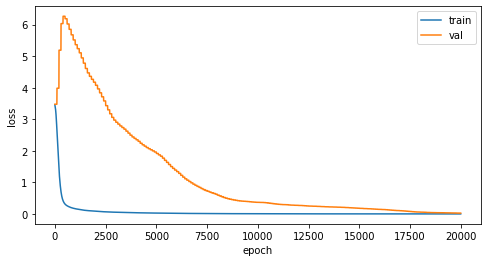

In [115]:
xor_test_1.model.train_val_plot(scale='linear',figsize=(8,4),cutoff=None)

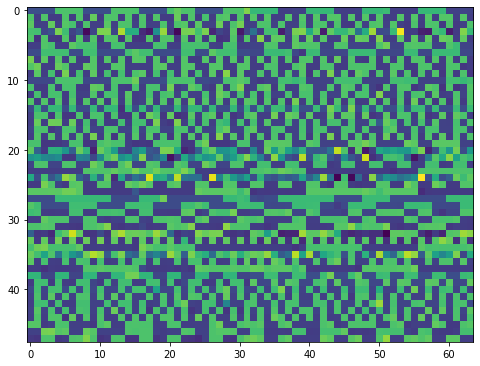

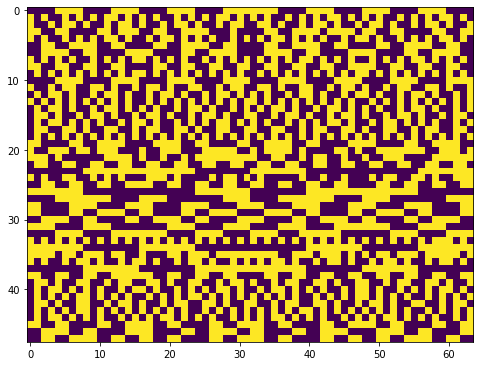

In [27]:
xor_test_1.model.view_weights()
xor_test_1.model.view_weights(func=lambda x:(x>0))

/var/folders/bh/tpcchpzx0txc5bh9rkqdnf640000gp/T/ipykernel_4510/2260883042.py:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax0, ax1, ax2) = plt.subplots(nrows=1,ncols=3,figsize=(15,4))


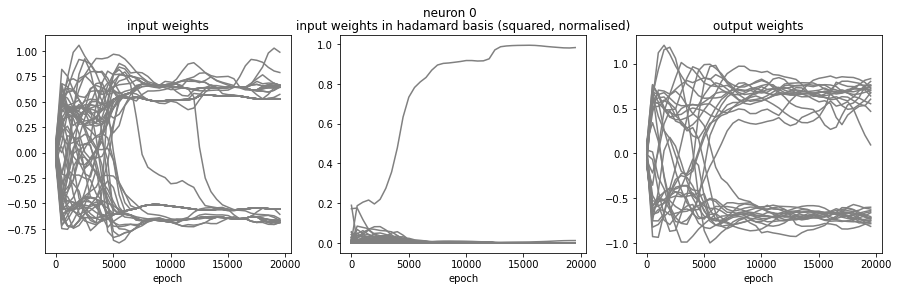

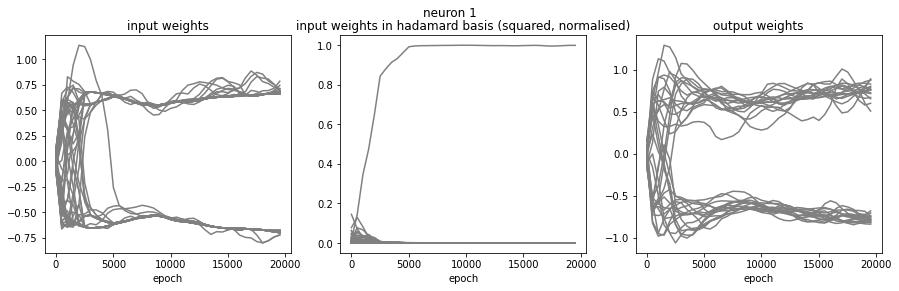

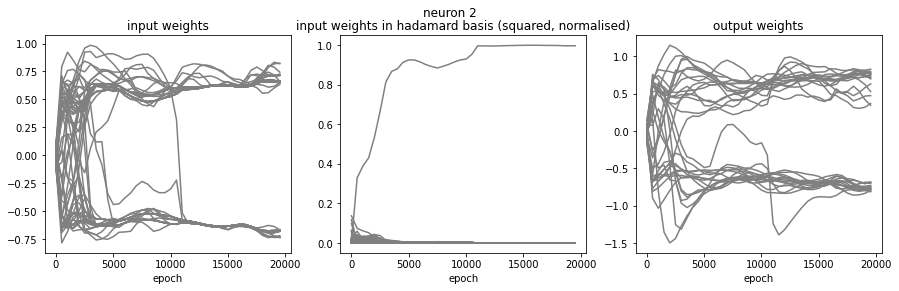

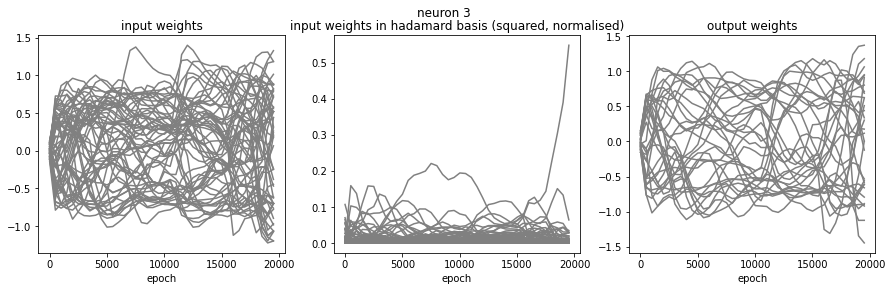

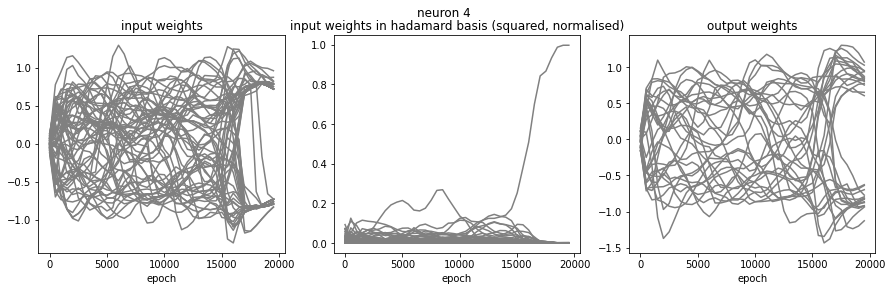

...

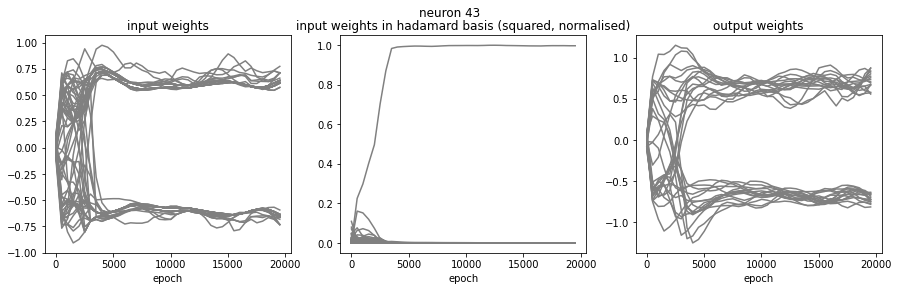

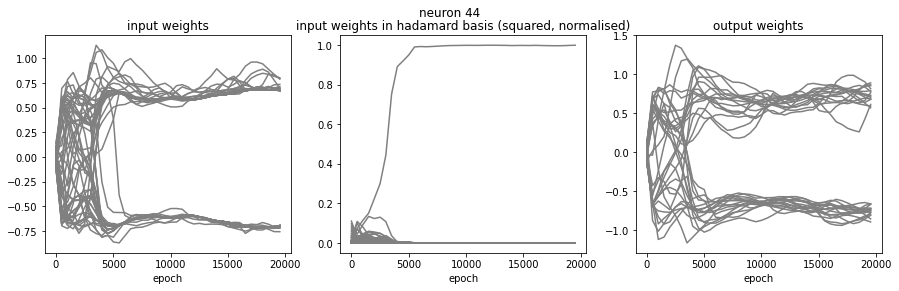

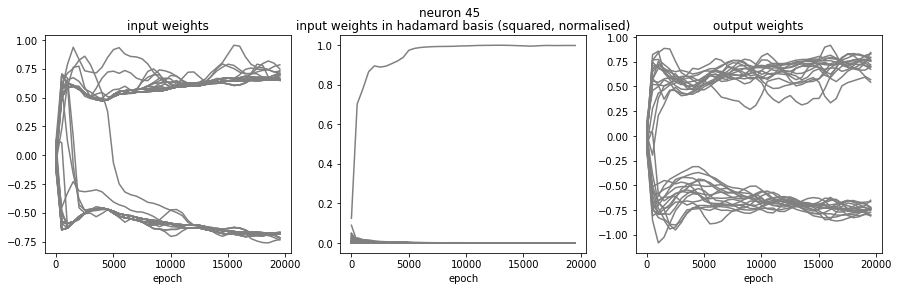

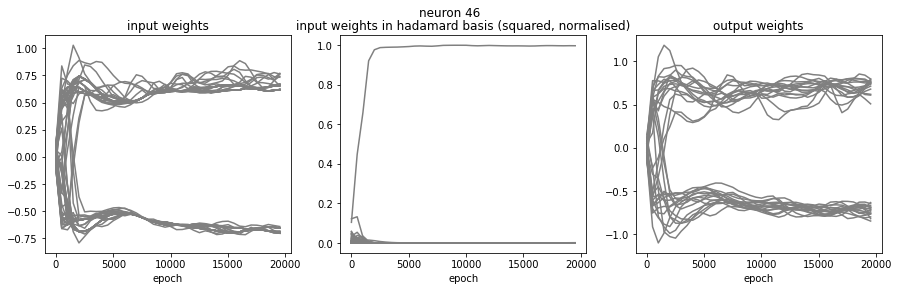

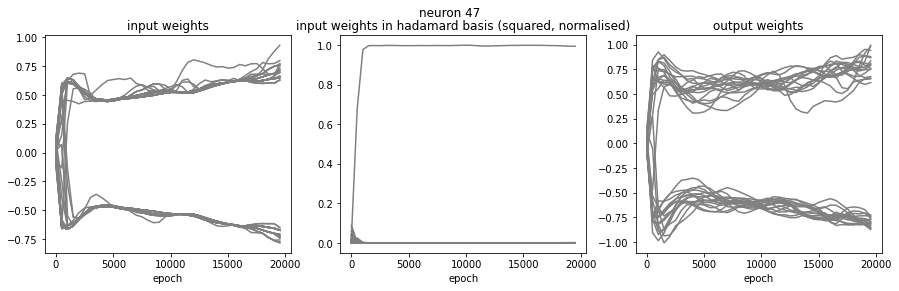

In [48]:
for i in range(48):
    xor_test_1.plot_neuron(i)

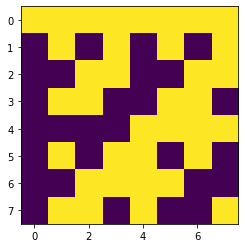

In [29]:
# plt.imshow(hadamard_matrix(3))

In [30]:
positives = (xor_test_1.model.get_weights()>0)
special_vecs = [xor_parity(6,j) for j in range(64)]+[1-xor_parity(6,j) for j in range(64)]

(array([40.,  1.,  2.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  1.,  1.,  0.,  0.,  1.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 <BarContainer object of 31 artists>)

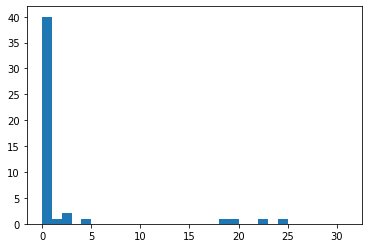

In [50]:
plt.hist([
    min(hamming(special_vecs[j], positives[i]) for j in range(128))
    for i in range(len(positives))
],
         bins=np.arange(32))

## model without weight decay

In [104]:
xor_test_2 = XOR_test(num_bits=5,
                      train_size=350,
                      num_hiddens=48,
                      num_layers=1,
                      lr=0.002,
                      wd=0,
                      save_points=list(range(10,20000,500)),)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [105]:
xor_test_2.train(epochs=20000,val_every=100)
xor_test_2.prepare_hiddens()

100%|████████████████████████████████████| 20000/20000 [01:04<00:00, 310.48it/s]


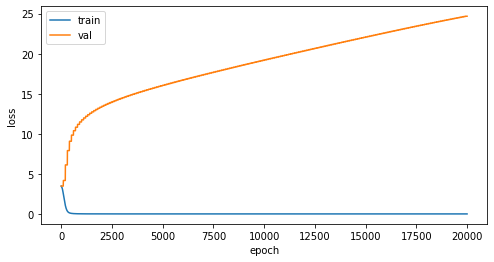

In [118]:
xor_test_2.model.train_val_plot(scale='linear',figsize=(8,4),cutoff=None)

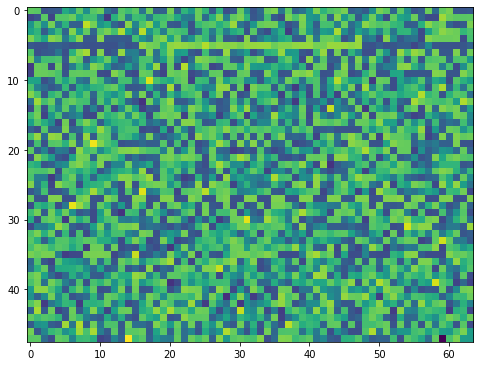

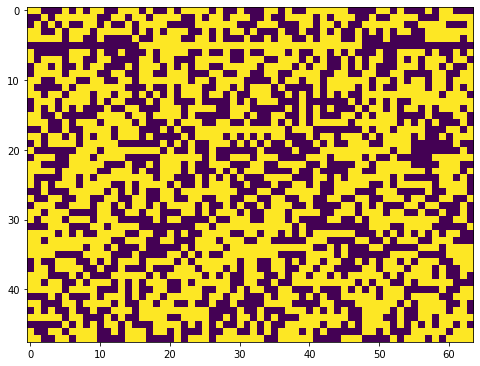

In [107]:
xor_test_2.model.view_weights()
xor_test_2.model.view_weights(func=lambda x:(x>0))

/var/folders/bh/tpcchpzx0txc5bh9rkqdnf640000gp/T/ipykernel_4510/2260883042.py:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax0, ax1, ax2) = plt.subplots(nrows=1,ncols=3,figsize=(15,4))


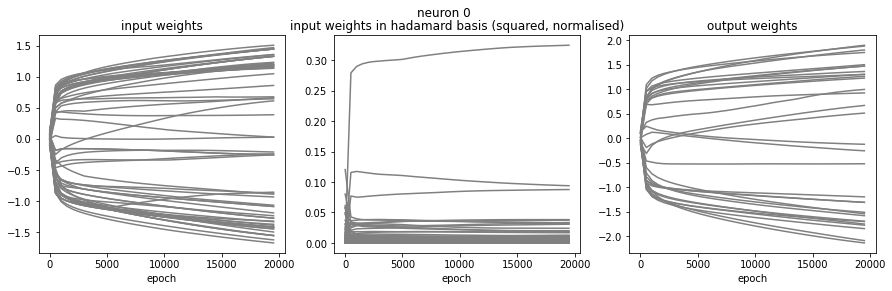

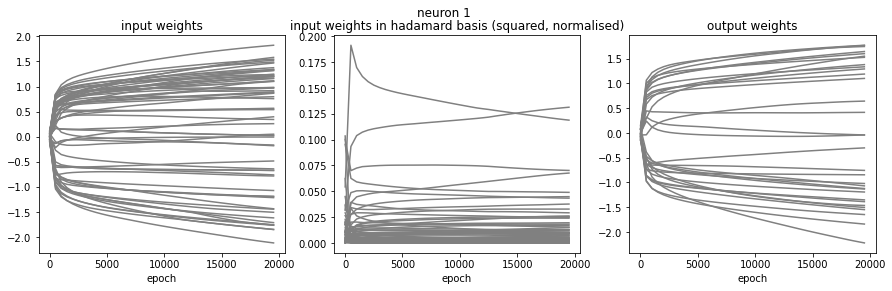

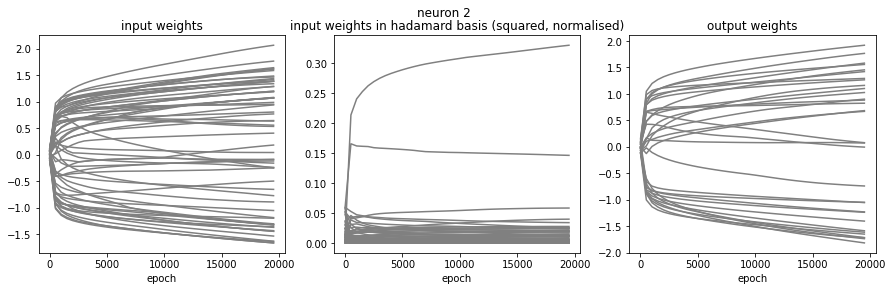

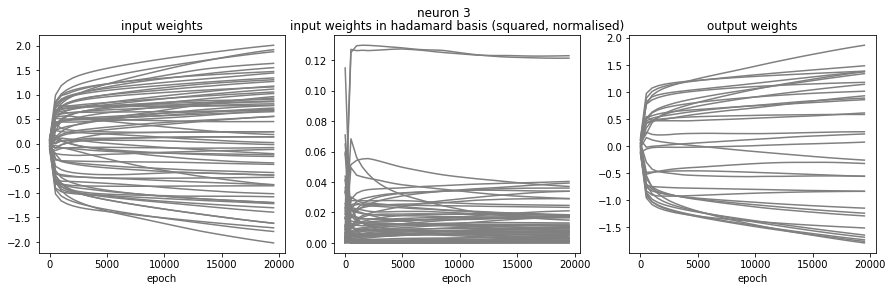

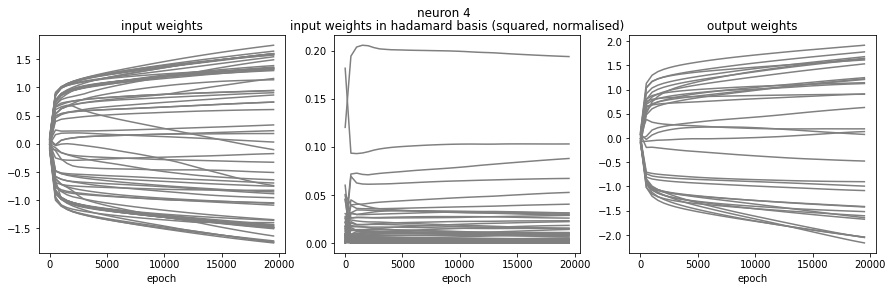

...

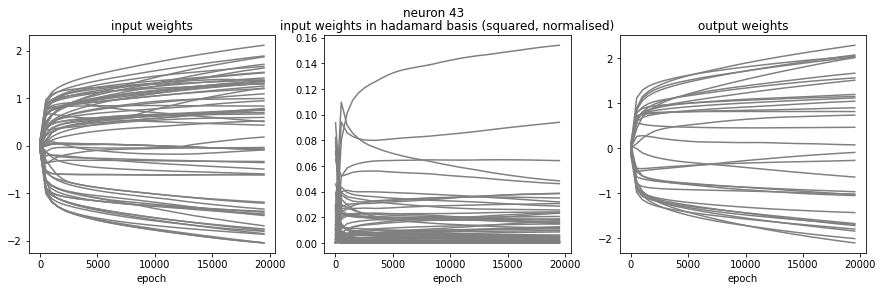

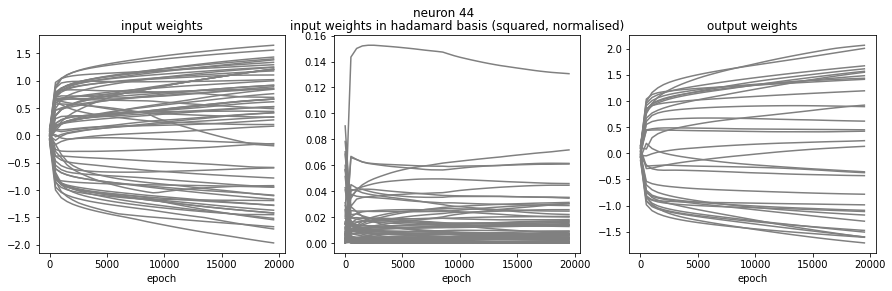

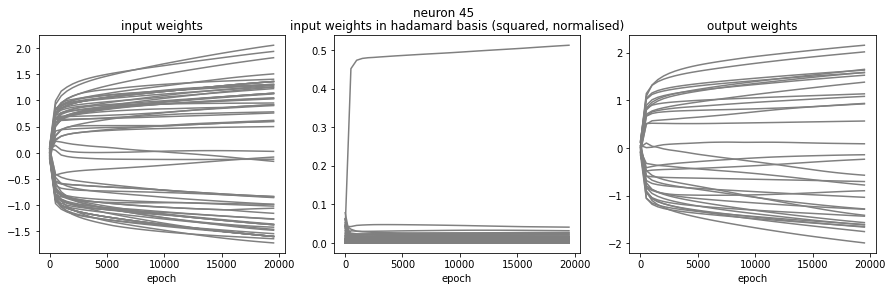

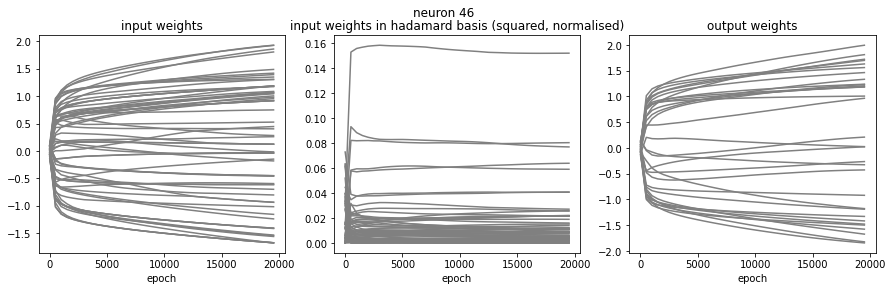

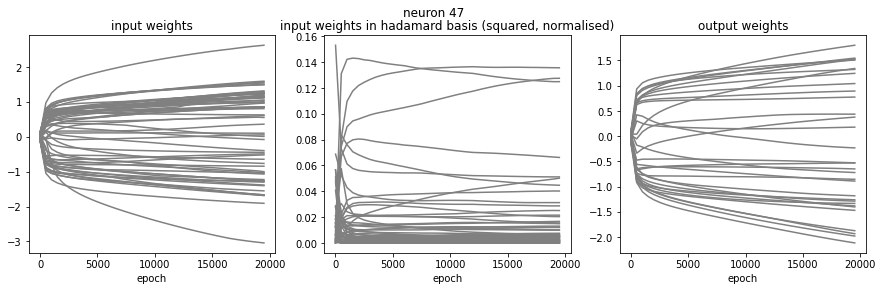

In [108]:
for i in range(48):
    xor_test_2.plot_neuron(i)

In [93]:
(list(xor_test_1.model.net[0].parameters())[1]).clone().detach().mean()

tensor(0.0829)

In [92]:
(list(xor_test_2.model.net[0].parameters())[1]).clone().detach().mean()

tensor(0.4141)

## model turning on weight decay halfway

In [98]:
xor_test_3 = XOR_test(num_bits=5,
                      train_size=350,
                      num_hiddens=48,
                      num_layers=1,
                      lr=0.002,
                      wd=0,
                      save_points=list(range(10,20000,500)),)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [99]:
xor_test_3.train(epochs=10000,val_every=100)
xor_test_3.model.optimiser = optim.AdamW(xor_test_3.model.parameters(),weight_decay=1,lr=0.002)
xor_test_3.train(epochs=10000,val_every=100)
xor_test_3.prepare_hiddens()

100%|████████████████████████████████████| 10000/10000 [00:28<00:00, 347.49it/s]


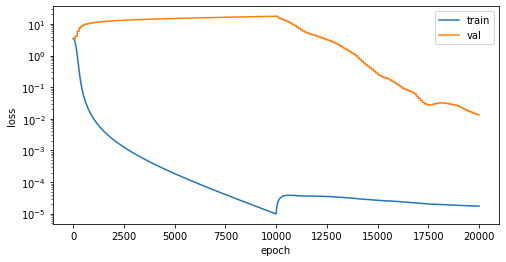

In [112]:
xor_test_3.model.train_val_plot(scale='log',figsize=(8,4),cutoff=None)

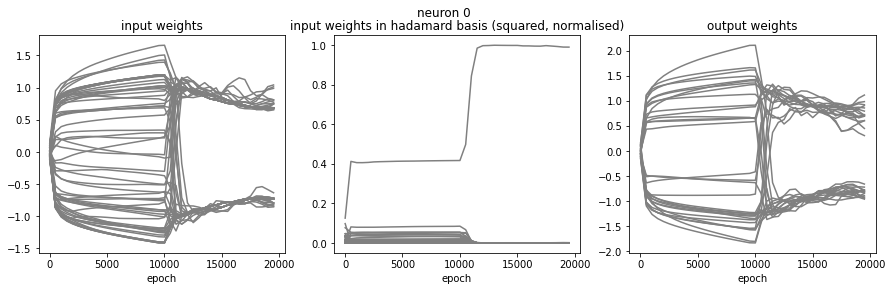

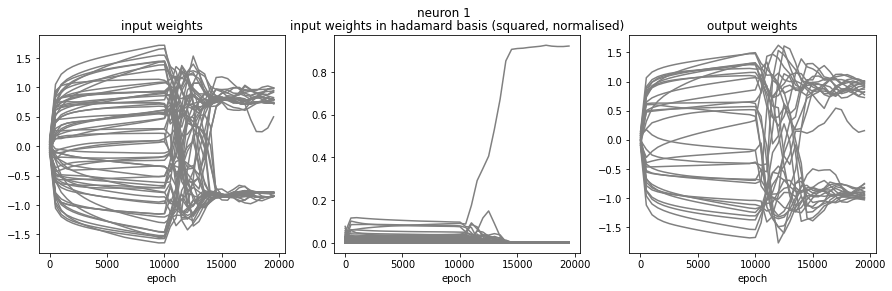

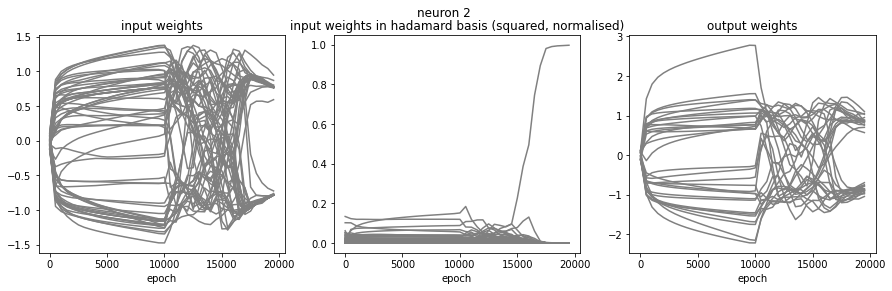

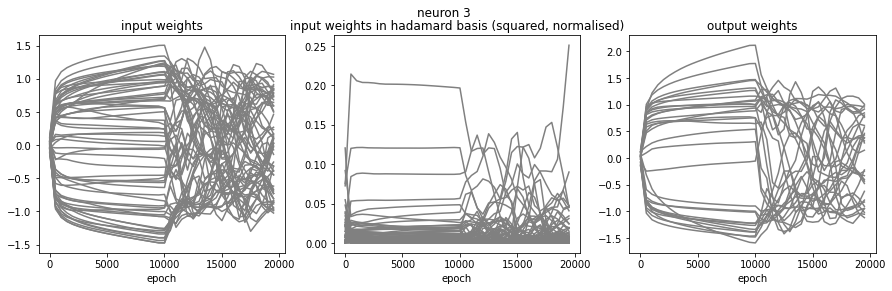

In [103]:
for i in range(4):
    xor_test_3.plot_neuron(i)

## model with all the data

In [109]:
xor_test_4 = XOR_test(num_bits=5,
                      train_size=1024,
                      num_hiddens=48,
                      num_layers=1,
                      lr=0.002,
                      wd=0,
                      save_points=list(range(10,20000,500)),)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [110]:
xor_test_4.train(epochs=10000,val_every=100)
xor_test_4.prepare_hiddens()

100%|████████████████████████████████████| 10000/10000 [01:17<00:00, 129.13it/s]


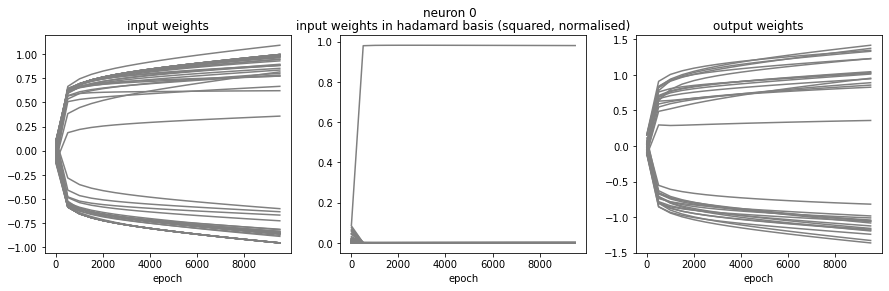

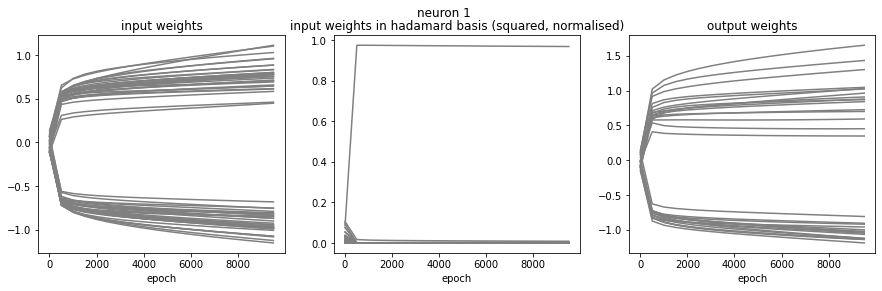

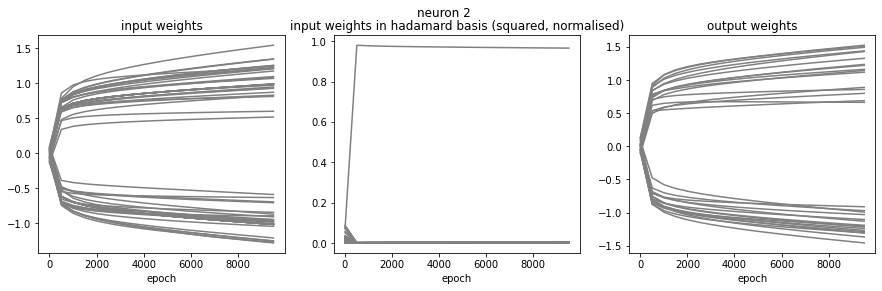

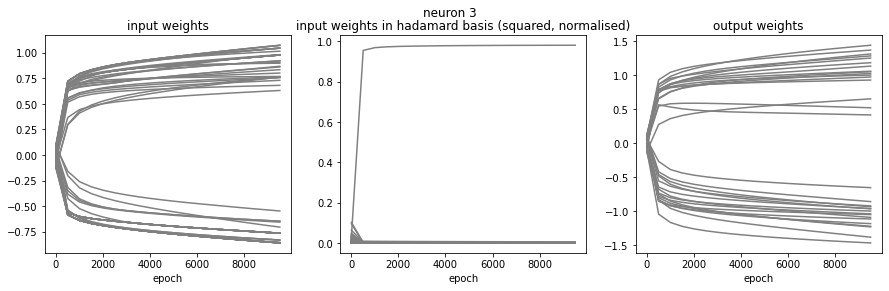

In [111]:
for i in range(4):
    xor_test_4.plot_neuron(i)